# **Library**

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
from scipy.interpolate import make_interp_spline
from scipy.interpolate import interp1d
from scipy.interpolate import UnivariateSpline
from sklearn.metrics import confusion_matrix
import datetime
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.io as pio
from sklearn.metrics import roc_curve, auc
from collections import Counter
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
%cd /content/drive/MyDrive/Colab Notebooks/Data

/content/drive/MyDrive/Colab Notebooks/Data


# Code


### Plot samples vs Predicted

In [ ]:
def samples_plot(y_test, y_test_pred, picture):  
  
  dfl = pd.DataFrame(y_test_pred, y_test)
  dfl
  dfl = dfl.sort_values(by='avg_temperature')

  l = list(range(0, y_test.count()))
  plt.xlabel('Samples')
  plt.ylabel('Predicted value')
  plt.title('Graph of comparison between predicted and real mean temperatures')
  plt.plot(l[::4], dfl.index[::4], c='red')
  plt.plot(l[::4], dfl[0][::4], '.', c='blue')
  plt.savefig(picture)

Plot scatter plot of the predicted versus real temperature

In [ ]:
def plot_scatter_reg(y_test_pred, y_test):
  fig = px.scatter(x=y_test_pred, y=y_test, color_discrete_sequence=['red', 'blue'], labels={'x': 'Predicted Temperature', 'y': 'Real Temperature'})
  fig.update_layout(title='Predicted vs. Real Mean Temperature')
  fig.show()

### Plot scatter plot of predicted temperature

In [ ]:
def plot_prediction(y_test, y_test_pred):
  fig = px.scatter(x=y_test.index, y=[y_test, y_test_pred], color_discrete_sequence=['red', 'blue'], 
              title='Predicted vs. Real Mean Temperature')
  fig.data[0].name = 'Actual'
  fig.data[1].name = 'Predicted'

  fig.update_layout(yaxis_title='Temperature (°C)')
  fig.update_layout(xaxis_title='Timestamp')
  fig.show()

### Regression with plots


In [ ]:
# Regression model
def regression_model(search, model, parameters, X_val, y_val, X_train, y_train, X_test, y_test, X_testing, y_testing, picture):
  evaluat_params_val = []
  evaluat_params_test = []

  if search == 'GridSearchCV':
    model = GridSearchCV(model, parameters, 
                       scoring = 'r2',
                       cv = 6, 
                       n_jobs = -1)
  elif search == 'RandomizedSearchCV':
    model = RandomizedSearchCV(model, parameters, 
                       scoring = 'r2',
                       cv = 6, 
                       n_jobs = -1,
                       n_iter = 100)
  
  model.fit(X_val, y_val)

  # Print the best parameters and the corresponding score
  print("Best parameters: ", model.best_params_)
  print("Best score: ", model.best_score_)

  # Train the best model
  best_model = model.best_estimator_
  best_model.fit(X_train, y_train)

  # Make predictions on the training, validation, test data
  y_val_pred = best_model.predict(X_val)
  y_test_pred = best_model.predict(X_test)
  y_testing_pred = best_model.predict(X_testing)

  # Calculate and print the evaluation metrics validatio
  mae = mean_absolute_error(y_val, y_val_pred)
  mse = mean_squared_error(y_val, y_val_pred)
  rmse = np.sqrt(mse)
  r2 = r2_score(y_val, y_val_pred)
  n = len(X_test)
  p = X_test.shape[1]
  adj_r2 = 1 - (1 - r2) * ((n - 1) / (n - p - 1))
  print(f'MAE: {mae:.4f}')
  print(f'MSE: {mse:.4f}')
  print(f'RMSE: {rmse:.4f}')
  print(f'R-squared: {r2:.4f}')
  print(f'Adjusted R-squared: {adj_r2:.4f}')
  evaluat_params_val = [mae, mse, rmse, r2, adj_r2]

  # Calculate and print the evaluation metrics test
  mae = mean_absolute_error(y_test, y_test_pred)
  mse = mean_squared_error(y_test, y_test_pred)
  rmse = np.sqrt(mse)
  r2 = r2_score(y_test, y_test_pred)
  n = len(X_test)
  p = X_test.shape[1]
  adj_r2 = 1 - (1 - r2) * ((n - 1) / (n - p - 1))
  print(f'MAE: {mae:.4f}')
  print(f'MSE: {mse:.4f}')
  print(f'RMSE: {rmse:.4f}')
  print(f'R-squared: {r2:.4f}')
  print(f'Adjusted R-squared: {adj_r2:.4f}')
  evaluat_params_test = [mae, mse, rmse, r2, adj_r2]

  plot_scatter_reg(y_test_pred, y_test)

  plot_prediction(y_test, y_test_pred)
  plot_prediction(y_testing, y_testing_pred)

  samples_plot(y_test, y_test_pred,picture)

  return evaluat_params_val, evaluat_params_test 

## Classifiaction model

In [ ]:
def classification_model(search, model, parameters, X_val, y_val, X_train, y_train, X_test, y_test):

  if search == 'GridSearchCV':
    model = GridSearchCV(model, parameters, 
                       scoring = 'r2',
                       cv = 6, 
                       n_jobs = -1)
  elif search == 'RandomizedSearchCV':
    model = RandomizedSearchCV(model, parameters, 
                       scoring = 'r2',
                       cv = 6, 
                       n_jobs = -1,
                       n_iter = 100)
  
  model.fit(X_val, y_val)

  # Print the best parameters and the corresponding score
  print("Best parameters: ", model.best_params_)
  print("Best score: ", model.best_score_)

  # Train the best model
  best_model = model.best_estimator_
  best_model.fit(X_train, y_train)

  # Make predictions on the training, validation, test data
  y_val_pred = best_model.predict(X_val)
  y_test_pred = best_model.predict(X_test)

  # calculate evaluation metrics
  accuracy = accuracy_score(y_val, y_val_pred)
  precision = precision_score(y_val, y_val_pred)
  recall = recall_score(y_val, y_val_pred)
  f1 = f1_score(y_val, y_val_pred)
  roc_auc = roc_auc_score(y_val, y_val_pred)

  # print evaluation metrics
  print("Accuracy:", accuracy)
  print("Precision:", precision)
  print("Recall:", recall)
  print("F1 Score:", f1)
  print("ROC AUC Score:", roc_auc)

  val_class = []
  val_class = [accuracy, precision, recall, f1, roc_auc]

  # calculate evaluation metrics
  accuracy = accuracy_score(y_test, y_test_pred)
  precision = precision_score(y_test, y_test_pred)
  recall = recall_score(y_test, y_test_pred)
  f1 = f1_score(y_test, y_test_pred)
  roc_auc = roc_auc_score(y_test, y_test_pred)

  # print evaluation metrics
  print("Accuracy:", accuracy)
  print("Precision:", precision)
  print("Recall:", recall)
  print("F1 Score:", f1)
  print("ROC AUC Score:", roc_auc)

  test_class = []
  test_class = [accuracy, precision, recall, f1, roc_auc]

  fig = px.scatter(y=[y_test, y_test_pred],symbol_sequence= ['square', 'circle-open'])
  fig.show()

  cm = confusion_matrix(y_test, y_test_pred)
  plot_confusion_matrix(cm)

  return val_class, test_class

### Plot confusion matrix

In [ ]:
def plot_confusion_matrix(cm):
    # Create a DataFrame from the confusion matrix
    df_cm = pd.DataFrame(cm, index=['Actual Negative', 'Actual Positive'], columns=['Predicted Negative', 'Predicted Positive'])
    total_sum = df_cm.sum().sum()  # Total count for calculating percentages

    # Calculate percentages
    df_cm_percent = (df_cm / total_sum) * 100

    # Create a heatmap of the confusion matrix using Plotly Express
    fig = px.imshow(df_cm.values,
                    labels=dict(x="Predicted", y="Actual", color="Count"),
                    x=['Predicted Negative', 'Predicted Positive'],
                    y=['Actual Negative', 'Actual Positive'],
                    color_continuous_scale='Blues')

    # Add the count values as annotations
    for i in range(len(df_cm)):
        for j in range(len(df_cm.columns)):
            fig.add_annotation(x=df_cm.columns[j], y=df_cm.index[i],
                               text=f"{df_cm.values[i, j]}<br>({df_cm_percent.values[i, j]:.2f}%)",
                               showarrow=False,
                               font=dict(color='white' if df_cm.values[i, j] > df_cm.max().max() / 2 else 'black'))

    # Customize the colorbar
    fig.update_layout(coloraxis_colorbar=dict(title="Count", xanchor="left", x=-0.2))

    # Show the figure
    fig.show()

## Load CSV files (Extract)

In [ ]:
# Load CSV file into a Pandas DataFrame
measures = pd.read_csv("Measures_ML.csv")
actuators = pd.read_csv("actuators.csv")
weather = pd.read_csv("weather.csv")
weather_forecast = pd.read_csv("weather_forecast.csv")

In [ ]:
# Print the size of the DataFrame
print("Size of Measures: ", measures.shape)
print("Size of Actuators: ", actuators.shape)
print("Size of Weather: ", weather.shape)
print("Size of Weather forecast: ", weather_forecast.shape)

Size of Measures:  (3234, 20)
Size of Actuators:  (4034, 6)
Size of Weather:  (553, 16)
Size of Weather forecast:  (553, 10)


In [ ]:
# Rename column
weather = weather.rename(columns={'time': 'timestamp'})
weather.head()

,feelslike,temperature,temp_min,temp_max,pressure,humidity,visibility,wind_speed,wind_direction,weather_main,weather_description,clouds,rain,sunrise,sunset,timestamp
0,12.79,13.17,12.27,13.95,1022,86,10000,2.57,50,Drizzle,light intensity drizzle,20.0,0.27,"""2023-05-03T03:29:48.000Z""","""2023-05-03T18:05:28.000Z""","""2023-05-02T22:01:47.000Z"""
1,12.54,12.94,11.71,13.95,1022,86,10000,2.57,10,Drizzle,light intensity drizzle,20.0,0.18,"""2023-05-03T03:29:48.000Z""","""2023-05-03T18:05:28.000Z""","""2023-05-02T22:31:47.000Z"""
2,12.48,12.89,11.16,13.95,1022,86,10000,3.09,350,Rain,light rain,75.0,0.12,"""2023-05-03T03:29:48.000Z""","""2023-05-03T18:05:28.000Z""","""2023-05-02T23:01:47.000Z"""
3,11.84,12.24,10.60,13.39,1022,89,10000,3.09,300,Clouds,scattered clouds,40.0,0.00,"""2023-05-03T03:29:48.000Z""","""2023-05-03T18:05:28.000Z""","""2023-05-02T23:31:47.000Z"""
4,11.99,12.40,11.16,13.02,1022,88,10000,3.09,280,Clouds,few clouds,20.0,0.00,"""2023-05-03T03:29:48.000Z""","""2023-05-03T18:05:28.000Z""","""2023-05-03T00:01:47.000Z"""


### Change of time format (Transform)

In [ ]:
# create a list of dataframes
df_list = [measures, actuators, weather_forecast, weather]

for df in df_list:
    # convert the timestamp column to datetime format
    df['timestamp'] = df['timestamp'].str.replace('"', '')
    df['timestamp'] = pd.to_datetime(df['timestamp'], format="%Y-%m-%dT%H:%M:%S.%fZ")
    
    # add two hours to timestamp column
    df['timestamp'] = df['timestamp'] + pd.Timedelta(hours=2)
    
    # set the timestamp column as index
    df.set_index('timestamp', inplace=True)

In [ ]:
for col in ['sunset', 'sunrise']:
    # convert the timestamp column to datetime format
    weather[col] = weather[col].str.replace('"', '')
    weather[col] = pd.to_datetime(weather[col], format="%Y-%m-%dT%H:%M:%S.%fZ")
    
    # add two hours to timestamp column
    weather[col] = weather[col] + pd.Timedelta(hours=2)

for col in ['time_3h', 'time_12h', 'time_24h']:
    # convert the timestamp column to datetime format
    weather_forecast[col] = weather_forecast[col].str.replace('"', '')
    weather_forecast[col] = pd.to_datetime(weather_forecast[col], format="%Y-%m-%dT%H:%M:%S.%fZ")
    
    # add two hours to timestamp column
    weather_forecast[col] = weather_forecast[col] + pd.Timedelta(hours=2)

## Fill empty spaces in Measures Dataframe

In [ ]:
def interpolate_data_spline(measures, actuators, kind='slinear'): # nearest/ slinear/ zero/ previous/ next
    # drop duplicates in actuators to avoid ValueError in np.unique
    actuators = actuators.loc[~actuators.index.duplicated(keep='first')]

    # get unique timestamps from the actuators dataframe and convert them to seconds
    timestamps = np.unique(actuators.index.values.astype(float) // 1e9)
    y_new = []

    for col in measures.columns:
        # create an interpolation function for the current column using spline interpolation and fill any missing values using extrapolation
        f = interp1d(measures.index.values.astype(float) // 1e9, measures[col], kind=kind, fill_value="extrapolate")

        # evaluate the interpolation function at the unique timestamps from the actuators dataframe
        y_new.append(f(timestamps))
    
    # create a new dataframe with the interpolated values, using the unique timestamps from the actuators dataframe as index
    measures_interp = pd.DataFrame(np.column_stack(y_new), index=pd.to_datetime(timestamps, unit='s'), columns=measures.columns)
    
    # interpolate for the missing values in actuators
    measures_interp = measures_interp.reindex(actuators.index).interpolate(method='time')

    # select only rows with timestamps that are in actuators
    actuators_interp = actuators.loc[actuators.index.isin(measures_interp.index)]

    return measures_interp, actuators_interp 

In [ ]:
# interpolate the data
measures_interp, actuators_interp  = interpolate_data_spline(measures, actuators)

# fill missing values using forward filling
measures_interp.fillna(method='ffill', inplace=True)

In [ ]:
print(measures_interp.shape)
measures_interp = measures_interp.rename(columns={'light': 'intensity'})
print(actuators_interp.shape)
measures_interp.head()

(3695, 19)
(3695, 5)


,BME680_temperature_b,BME680_humidity_b,BME680_pressure_b,BME680_gas_b,BME680_temperature_f,BME680_humidity_f,BME680_pressure_f,BME680_gas_f,DHT21_temperature,DHT21_humidity,DHT22_temperature,DHT22_humidity,moisture_right,moisture_left,temperature_soil,temperature_water,intensity,level,door
timestamp,,,,,,,,,,,,,,,,,,,
2023-05-03 00:00:00,16.241200,76.847733,1007.056267,59.912933,14.741333,82.252133,1006.726267,5.1512,7.0,44.637333,0.0,0.0,99.99,99.99,11.940000,18.716133,0.0,0.0,0.0
2023-05-03 00:01:47,16.230500,76.897667,1007.059833,60.005667,14.759167,82.173667,1006.729833,5.1405,7.0,44.601667,0.0,0.0,99.99,99.99,11.940000,18.691167,0.0,0.0,0.0
2023-05-03 00:06:47,16.200500,77.037667,1007.069833,60.265667,14.809167,81.953667,1006.739833,5.1105,7.0,44.501667,0.0,0.0,99.99,99.99,11.940000,18.621167,0.0,0.0,0.0
2023-05-03 00:11:47,16.190199,76.892990,1007.089601,61.005050,14.859003,81.430565,1006.759601,5.1100,7.0,44.598007,0.0,0.0,99.99,99.99,11.881196,18.620000,0.0,0.0,0.0
2023-05-03 00:16:47,16.141000,77.193800,1007.090000,61.461000,14.830600,81.253400,1006.750200,5.1100,7.0,44.502000,0.0,0.0,99.99,99.99,11.880000,18.561200,0.0,0.0,0.0


### Delete columns with strings and visibilty

In [ ]:
weather = weather.drop(['weather_main','weather_description','visibility'], axis=1)
weather_forecast = weather_forecast.drop(['weather_main_3h','weather_main_12h','weather_main_24h'], axis=1)

In [ ]:
print(weather.shape)

(553, 12)


## Filling empty spaces in weather and wheather_forecast dataframe

In [ ]:
# Change of time to nanoseconds from 1.1.1970
weather['sunrise'] = pd.to_numeric(weather['sunrise'])
weather['sunset'] = pd.to_numeric(weather['sunset'])

weather_forecast['time_3h'] = pd.to_numeric(weather_forecast['time_3h'])
weather_forecast['time_12h'] = pd.to_numeric(weather_forecast['time_12h'])
weather_forecast['time_24h'] = pd.to_numeric(weather_forecast['time_24h'])

In [ ]:
# Interpolate the dataframes to fill the gaps and get the exact same number of rows as in actuators_interp
f_weather_forecast = interp1d(weather_forecast.index.astype(int), weather_forecast.values, axis=0, kind='previous', fill_value='extrapolate')
f_weather = interp1d(weather.index.astype(int), weather.values, axis=0, kind='previous', fill_value='extrapolate')

new_index = actuators_interp.index
weather_forecast_interpolated = pd.DataFrame(data=f_weather_forecast(new_index.astype(int)), index=new_index, columns=weather_forecast.columns)
weather_interpolated = pd.DataFrame(data=f_weather(new_index.astype(int)), index=new_index, columns=weather.columns)

In [ ]:
print(weather_forecast_interpolated.shape)
weather_forecast_interpolated.head()

(3695, 6)


,temperature_3h,temperature_12h,temperature_24h,time_3h,time_12h,time_24h
timestamp,,,,,,
2023-05-03 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN
2023-05-03 00:01:47,12.73,13.82,8.65,1.683079e+18,1.683112e+18,1.683155e+18
2023-05-03 00:06:47,12.73,13.82,8.65,1.683079e+18,1.683112e+18,1.683155e+18
2023-05-03 00:11:47,12.73,13.82,8.65,1.683079e+18,1.683112e+18,1.683155e+18
2023-05-03 00:16:47,12.73,13.82,8.65,1.683079e+18,1.683112e+18,1.683155e+18


In [ ]:
print(weather_interpolated.shape)
weather_interpolated.head()

(3695, 12)


,feelslike,temperature,temp_min,temp_max,pressure,humidity,wind_speed,wind_direction,clouds,rain,sunrise,sunset
timestamp,,,,,,,,,,,,
2023-05-03 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2023-05-03 00:01:47,12.79,13.17,12.27,13.95,1022.0,86.0,2.57,50.0,20.0,0.27,1.683092e+18,1.683144e+18
2023-05-03 00:06:47,12.79,13.17,12.27,13.95,1022.0,86.0,2.57,50.0,20.0,0.27,1.683092e+18,1.683144e+18
2023-05-03 00:11:47,12.79,13.17,12.27,13.95,1022.0,86.0,2.57,50.0,20.0,0.27,1.683092e+18,1.683144e+18
2023-05-03 00:16:47,12.79,13.17,12.27,13.95,1022.0,86.0,2.57,50.0,20.0,0.27,1.683092e+18,1.683144e+18


In [ ]:
weather_interpolated.loc[weather_interpolated.index[0]] = weather_interpolated.loc[weather_interpolated.index[1]]
weather_forecast_interpolated.loc[weather_forecast_interpolated.index[0]] = weather_forecast_interpolated.loc[weather_forecast_interpolated.index[1]]

In [ ]:
print(weather_interpolated.shape)
print(actuators_interp.shape)
weather_interpolated.head()

(3695, 12)
(3695, 5)


,feelslike,temperature,temp_min,temp_max,pressure,humidity,wind_speed,wind_direction,clouds,rain,sunrise,sunset
timestamp,,,,,,,,,,,,
2023-05-03 00:00:00,12.79,13.17,12.27,13.95,1022.0,86.0,2.57,50.0,20.0,0.27,1.683092e+18,1.683144e+18
2023-05-03 00:01:47,12.79,13.17,12.27,13.95,1022.0,86.0,2.57,50.0,20.0,0.27,1.683092e+18,1.683144e+18
2023-05-03 00:06:47,12.79,13.17,12.27,13.95,1022.0,86.0,2.57,50.0,20.0,0.27,1.683092e+18,1.683144e+18
2023-05-03 00:11:47,12.79,13.17,12.27,13.95,1022.0,86.0,2.57,50.0,20.0,0.27,1.683092e+18,1.683144e+18
2023-05-03 00:16:47,12.79,13.17,12.27,13.95,1022.0,86.0,2.57,50.0,20.0,0.27,1.683092e+18,1.683144e+18


In [ ]:
print(actuators_interp.shape)
print(weather_forecast_interpolated.shape)
weather_forecast_interpolated.head()

(3695, 5)
(3695, 6)


,temperature_3h,temperature_12h,temperature_24h,time_3h,time_12h,time_24h
timestamp,,,,,,
2023-05-03 00:00:00,12.73,13.82,8.65,1.683079e+18,1.683112e+18,1.683155e+18
2023-05-03 00:01:47,12.73,13.82,8.65,1.683079e+18,1.683112e+18,1.683155e+18
2023-05-03 00:06:47,12.73,13.82,8.65,1.683079e+18,1.683112e+18,1.683155e+18
2023-05-03 00:11:47,12.73,13.82,8.65,1.683079e+18,1.683112e+18,1.683155e+18
2023-05-03 00:16:47,12.73,13.82,8.65,1.683079e+18,1.683112e+18,1.683155e+18


## Graph

In [ ]:
import plotly.tools as sp
import plotly.graph_objs as go
import plotly.subplots as sp

In [ ]:
# Create subplot grid for all subplots
fig = sp.make_subplots(rows=2, cols=2, 
                       subplot_titles=("BME Temperatures", "Weather vs BME680 Temperature", "Average Temperature and BME Humidity", "Temperature and Other Measurements"))

# First subplot
fig.add_trace(go.Scatter(x=measures_interp.index, y=measures_interp['BME680_temperature_b'], name='BME680_temperature_b'), row=1, col=1)
fig.add_trace(go.Scatter(x=measures_interp.index, y=measures_interp['BME680_temperature_f'], name='BME680_temperature_f'), row=1, col=1)

fig.update_layout(title='Temperature Subplots')

# Second subplot
fig.add_trace(go.Scatter(x=weather_interpolated.index, y=weather_interpolated['temperature'], name='Weather temperature'), row=1, col=2)
fig.add_trace(go.Scatter(x=measures_interp.index, y=measures_interp['BME680_temperature_f'], name='BME680_temperature_b'), row=1, col=2)

# Third subplot
avg_temp = (measures_interp['BME680_temperature_b'] + measures_interp['BME680_temperature_f']) / 2

fig.add_trace(go.Scatter(x=measures_interp.index, y=avg_temp, name='Average Temperature'), row=2, col=1)
fig.add_trace(go.Scatter(x=measures_interp.index, y=measures_interp['BME680_humidity_b'], name='BME680_humidity_b'), row=2, col=1)
fig.add_trace(go.Scatter(x=measures_interp.index, y=measures_interp['BME680_humidity_f'], name='BME680_humidity_f'), row=2, col=1)

fig.update_yaxes(title_text="Temperature (°C)", row=2, col=1, secondary_y=False)
fig.update_yaxes(title_text="Humidity", row=2, col=1, secondary_y=True)

# Fourth subplot
fig.add_trace(go.Scatter(x=measures_interp.index, y=avg_temp, name='Average Temperature'), row=2, col=2)
fig.add_trace(go.Scatter(x=measures_interp.index, y=measures_interp['intensity'], name='Intensity'), row=2, col=2)
fig.add_trace(go.Scatter(x=measures_interp.index, y=measures_interp['temperature_soil'], name='Soil Temperature'), row=2, col=2)

# Update axis configuration 'legend'] = {'x': 0.5, 'y': 1.15, 'xanchor': 'center', 'yanchor': 'top', 'orientation': 'h'}
fig.update_layout(yaxis=dict(title='Temperature (°C)'), yaxis2=dict(title='Humidity'),
                  yaxis3=dict(title='Intensity', side='right', overlaying='y', anchor='x', titlefont={'color': 'red'}, tickfont={'color': 'red'}),
                  yaxis4=dict(title='Ventilation', side='left', overlaying='y', anchor='free', titlefont={'color': 'purple'}, tickfont={'color': 'purple'}),
                  yaxis1=dict(title='Average and Outside Temperature', titlefont={'color': 'orange'}, tickfont={'color': 'orange'}),
                  xaxis1=dict(title='Timestamp'), 
                  xaxis2=dict(title='Timestamp'),
                 )

fig.show()




## Heatmap

In [ ]:
# Concatenate the dataframes into a single dataframe
concatenated_df = pd.concat([measures_interp, actuators_interp, weather_interpolated, weather_forecast_interpolated], axis=1)

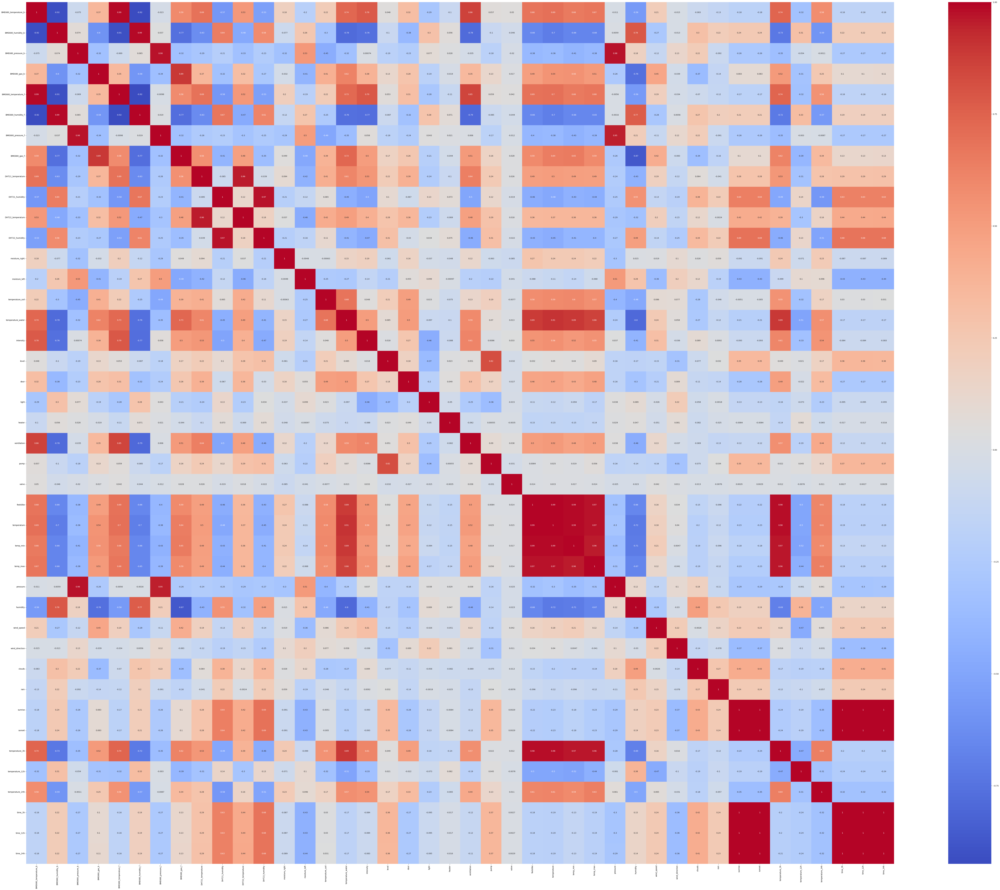

In [ ]:
plt.figure(figsize=(100, 80))
sns.heatmap(concatenated_df.corr(), annot=True, cmap='coolwarm')
plt.show()

## Compute the mean temperature, humidity


In [ ]:
concatenated_df[['DHT21_temperature', 'DHT22_temperature']] = concatenated_df[['DHT21_temperature', 'DHT22_temperature']].replace(0, np.nan)

In [ ]:
cols = ['BME680_temperature_b', 'BME680_temperature_f']
avg_temperature = concatenated_df[cols].mean(axis=1)

In [ ]:
concatenated_df = concatenated_df.drop(['BME680_temperature_b', 'BME680_temperature_f', 'DHT21_temperature', 'DHT22_temperature'], axis=1)
concatenated_df.head()

,BME680_humidity_b,BME680_pressure_b,BME680_gas_b,BME680_humidity_f,BME680_pressure_f,BME680_gas_f,DHT21_humidity,DHT22_humidity,moisture_right,moisture_left,...,clouds,rain,sunrise,sunset,temperature_3h,temperature_12h,temperature_24h,time_3h,time_12h,time_24h
timestamp,,,,,,,,,,,,,,,,,,,,,
2023-05-03 00:00:00,76.847733,1007.056267,59.912933,82.252133,1006.726267,5.1512,44.637333,0.0,99.99,99.99,...,20.0,0.27,1.683092e+18,1.683144e+18,12.73,13.82,8.65,1.683079e+18,1.683112e+18,1.683155e+18
2023-05-03 00:01:47,76.897667,1007.059833,60.005667,82.173667,1006.729833,5.1405,44.601667,0.0,99.99,99.99,...,20.0,0.27,1.683092e+18,1.683144e+18,12.73,13.82,8.65,1.683079e+18,1.683112e+18,1.683155e+18
2023-05-03 00:06:47,77.037667,1007.069833,60.265667,81.953667,1006.739833,5.1105,44.501667,0.0,99.99,99.99,...,20.0,0.27,1.683092e+18,1.683144e+18,12.73,13.82,8.65,1.683079e+18,1.683112e+18,1.683155e+18
2023-05-03 00:11:47,76.892990,1007.089601,61.005050,81.430565,1006.759601,5.1100,44.598007,0.0,99.99,99.99,...,20.0,0.27,1.683092e+18,1.683144e+18,12.73,13.82,8.65,1.683079e+18,1.683112e+18,1.683155e+18
2023-05-03 00:16:47,77.193800,1007.090000,61.461000,81.253400,1006.750200,5.1100,44.502000,0.0,99.99,99.99,...,20.0,0.27,1.683092e+18,1.683144e+18,12.73,13.82,8.65,1.683079e+18,1.683112e+18,1.683155e+18


In [ ]:
concatenated_df[['DHT21_humidity', 'DHT22_humidity']] = concatenated_df[['DHT21_humidity', 'DHT22_humidity']].replace(0, np.nan)

In [ ]:
cols = ['BME680_humidity_b', 'BME680_humidity_f']
avg_humidity = concatenated_df[cols].mean(axis=1)

In [ ]:
concatenated_df = concatenated_df.drop(['BME680_humidity_b', 'BME680_humidity_f', 'DHT21_humidity', 'DHT22_humidity'], axis=1)
concatenated_df.head()

,BME680_pressure_b,BME680_gas_b,BME680_pressure_f,BME680_gas_f,moisture_right,moisture_left,temperature_soil,temperature_water,intensity,level,...,clouds,rain,sunrise,sunset,temperature_3h,temperature_12h,temperature_24h,time_3h,time_12h,time_24h
timestamp,,,,,,,,,,,,,,,,,,,,,
2023-05-03 00:00:00,1007.056267,59.912933,1006.726267,5.1512,99.99,99.99,11.940000,18.716133,0.0,0.0,...,20.0,0.27,1.683092e+18,1.683144e+18,12.73,13.82,8.65,1.683079e+18,1.683112e+18,1.683155e+18
2023-05-03 00:01:47,1007.059833,60.005667,1006.729833,5.1405,99.99,99.99,11.940000,18.691167,0.0,0.0,...,20.0,0.27,1.683092e+18,1.683144e+18,12.73,13.82,8.65,1.683079e+18,1.683112e+18,1.683155e+18
2023-05-03 00:06:47,1007.069833,60.265667,1006.739833,5.1105,99.99,99.99,11.940000,18.621167,0.0,0.0,...,20.0,0.27,1.683092e+18,1.683144e+18,12.73,13.82,8.65,1.683079e+18,1.683112e+18,1.683155e+18
2023-05-03 00:11:47,1007.089601,61.005050,1006.759601,5.1100,99.99,99.99,11.881196,18.620000,0.0,0.0,...,20.0,0.27,1.683092e+18,1.683144e+18,12.73,13.82,8.65,1.683079e+18,1.683112e+18,1.683155e+18
2023-05-03 00:16:47,1007.090000,61.461000,1006.750200,5.1100,99.99,99.99,11.880000,18.561200,0.0,0.0,...,20.0,0.27,1.683092e+18,1.683144e+18,12.73,13.82,8.65,1.683079e+18,1.683112e+18,1.683155e+18


In [ ]:
concatenated_df = pd.concat([avg_temperature, avg_humidity, concatenated_df], axis=1)

In [ ]:
# Rename column
concatenated_df = concatenated_df.rename(columns={0: 'avg_temperature'})
concatenated_df = concatenated_df.rename(columns={1: 'avg_humidity'})
concatenated_df.head()

,avg_temperature,avg_humidity,BME680_pressure_b,BME680_gas_b,BME680_pressure_f,BME680_gas_f,moisture_right,moisture_left,temperature_soil,temperature_water,...,clouds,rain,sunrise,sunset,temperature_3h,temperature_12h,temperature_24h,time_3h,time_12h,time_24h
timestamp,,,,,,,,,,,,,,,,,,,,,
2023-05-03 00:00:00,15.491267,79.549933,1007.056267,59.912933,1006.726267,5.1512,99.99,99.99,11.940000,18.716133,...,20.0,0.27,1.683092e+18,1.683144e+18,12.73,13.82,8.65,1.683079e+18,1.683112e+18,1.683155e+18
2023-05-03 00:01:47,15.494833,79.535667,1007.059833,60.005667,1006.729833,5.1405,99.99,99.99,11.940000,18.691167,...,20.0,0.27,1.683092e+18,1.683144e+18,12.73,13.82,8.65,1.683079e+18,1.683112e+18,1.683155e+18
2023-05-03 00:06:47,15.504833,79.495667,1007.069833,60.265667,1006.739833,5.1105,99.99,99.99,11.940000,18.621167,...,20.0,0.27,1.683092e+18,1.683144e+18,12.73,13.82,8.65,1.683079e+18,1.683112e+18,1.683155e+18
2023-05-03 00:11:47,15.524601,79.161777,1007.089601,61.005050,1006.759601,5.1100,99.99,99.99,11.881196,18.620000,...,20.0,0.27,1.683092e+18,1.683144e+18,12.73,13.82,8.65,1.683079e+18,1.683112e+18,1.683155e+18
2023-05-03 00:16:47,15.485800,79.223600,1007.090000,61.461000,1006.750200,5.1100,99.99,99.99,11.880000,18.561200,...,20.0,0.27,1.683092e+18,1.683144e+18,12.73,13.82,8.65,1.683079e+18,1.683112e+18,1.683155e+18


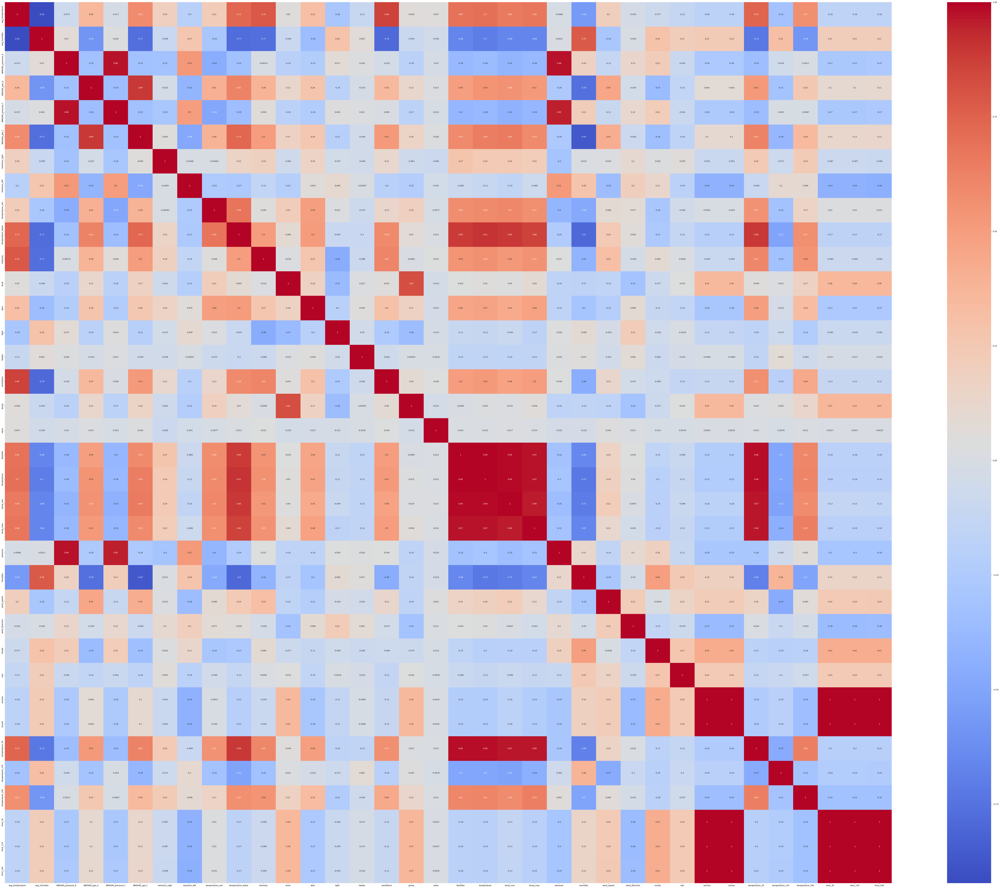

In [ ]:
plt.figure(figsize=(100, 80))
sns.heatmap(concatenated_df.corr(), annot=True, cmap='coolwarm')
plt.show()

# Save the dataframe to CSV (Load)

In [ ]:
concatenated_df.columns

Index(['avg_temperature', 'avg_humidity', 'BME680_pressure_b', 'BME680_gas_b',
       'BME680_pressure_f', 'BME680_gas_f', 'moisture_right', 'moisture_left',
       'temperature_soil', 'temperature_water', 'intensity', 'level', 'door',
       'light', 'heater', 'ventilation', 'pump', 'valve', 'feelslike',
       'temperature', 'temp_min', 'temp_max', 'pressure', 'humidity',
       'wind_speed', 'wind_direction', 'clouds', 'rain', 'sunrise', 'sunset',
       'temperature_3h', 'temperature_12h', 'temperature_24h', 'time_3h',
       'time_12h', 'time_24h'],
      dtype='object')

In [ ]:
separated_data = concatenated_df[['avg_temperature', 'avg_humidity','temperature_soil','intensity','door','temperature', 'temperature_3h', 'temperature_24h','ventilation']] # +sunrise/sunset

In [ ]:
separated_data

,avg_temperature,avg_humidity,temperature_soil,intensity,door,temperature,temperature_3h,temperature_24h,ventilation
timestamp,,,,,,,,,
2023-05-03 00:00:00,15.491267,79.549933,11.940000,0.000000,0.0,13.17,12.73,8.65,0
2023-05-03 00:01:47,15.494833,79.535667,11.940000,0.000000,0.0,13.17,12.73,8.65,0
2023-05-03 00:06:47,15.504833,79.495667,11.940000,0.000000,0.0,13.17,12.73,8.65,0
2023-05-03 00:11:47,15.524601,79.161777,11.881196,0.000000,0.0,13.17,12.73,8.65,0
2023-05-03 00:16:47,15.485800,79.223600,11.880000,0.000000,0.0,13.17,12.73,8.65,0
...,...,...,...,...,...,...,...,...,...
2023-05-14 10:22:55,16.606917,79.597317,10.880000,76.890000,0.0,10.33,10.33,12.63,0
2023-05-14 10:27:55,16.910467,77.424450,10.880000,73.853333,0.0,10.33,10.33,12.63,0
2023-05-14 10:32:55,16.651229,77.425897,10.882193,70.036545,0.0,10.33,10.33,12.63,0


In [ ]:
# check for missing values
separated_data.isnull().sum()

avg_temperature     0
avg_humidity        0
temperature_soil    0
intensity           0
door                0
temperature         0
temperature_3h      0
temperature_24h     0
ventilation         0
dtype: int64

In [ ]:
# separated_data.to_csv('Data_DP.csv', index=False)

In [ ]:
layout = {'title': 'Average Temperature Over Time'}
traces = []

traces.append({'x': separated_data.index, 'y': separated_data["temperature"], 'name': 'Outside Temperature', 'line': {'color': 'blue'}})
traces.append({'x': separated_data.index, 'y': separated_data["intensity"], 'name': 'Intensity','yaxis': 'y2', 'line': {'color': 'darkturquoise'}})
traces.append({'x': separated_data.index, 'y': separated_data["ventilation"], 'name': 'Ventilation', 'yaxis': 'y3', 'line': {'color': 'darkorange', 'width': 0.6}})
traces.append({'x': separated_data.index, 'y': separated_data["avg_temperature"], 'name': 'Average Temperature','line': {'color': 'orchid', 'width': 4}})

layout['legend'] = {'x': 0.5, 'y': 1.15, 'xanchor': 'center', 'yanchor': 'top', 'orientation': 'h'}
layout['xaxis'] = {'domain': [0.06, 0.98]}
layout['yaxis2'] = {'title': 'Intensity', 'side': 'right', 'overlaying': 'y', 'anchor': 'x', 'titlefont': {'color': 'darkturquoise'}, 'tickfont': {'color': 'darkturquoise'}}
layout['yaxis3'] = {'title': 'Ventilation', 'side': 'left', 'overlaying': 'y', 'anchor': 'free', 'titlefont': {'color': 'darkorange'}, 'tickfont': {'color': 'darkorange'}}
layout['yaxis1'] = {'title': 'Average and Outside Temperature', 'titlefont': {'color': 'blue'}, 'tickfont': {'color': 'blue'}}

pio.show({'data': traces, 'layout': layout})

# Data featuring

Detecting outliers

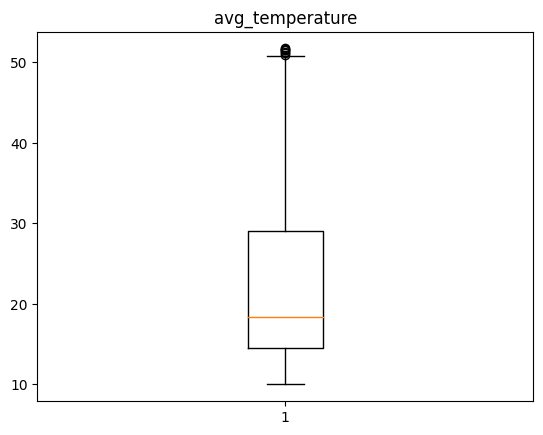

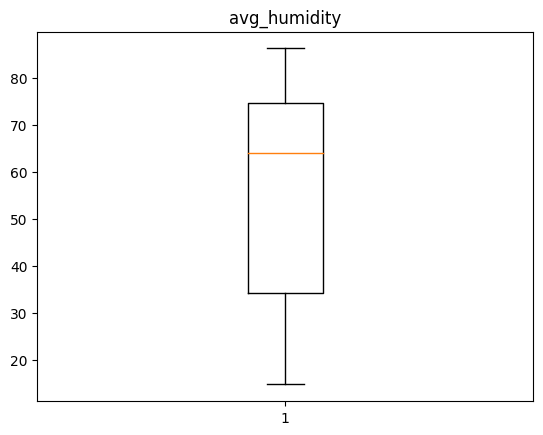

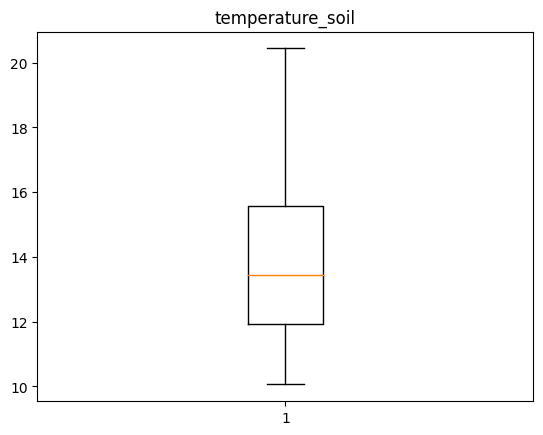

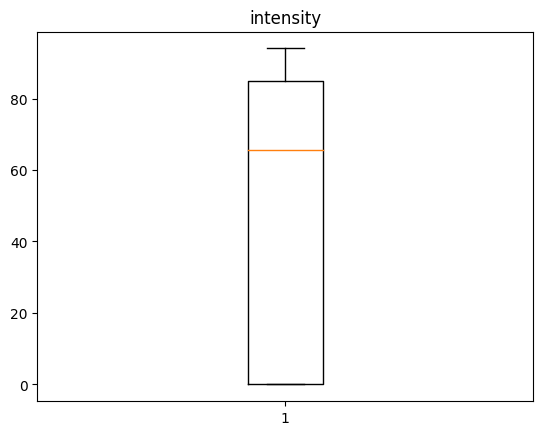

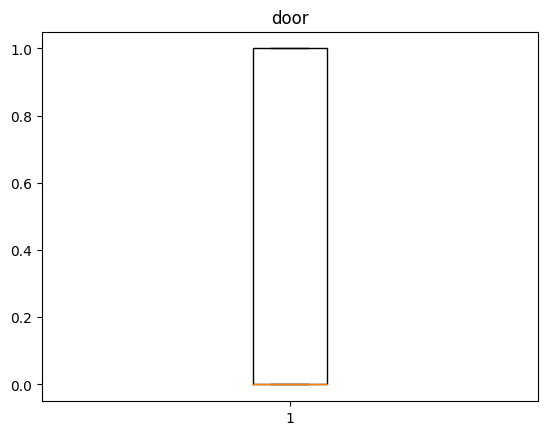

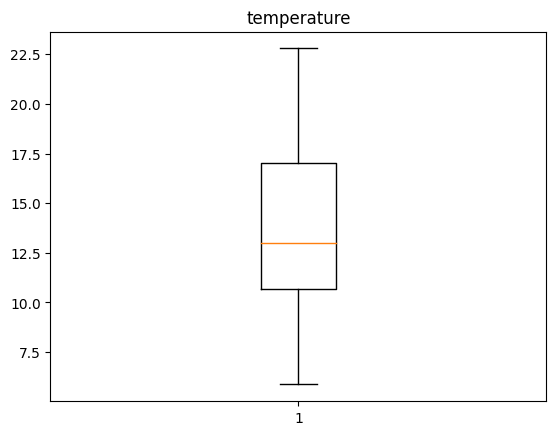

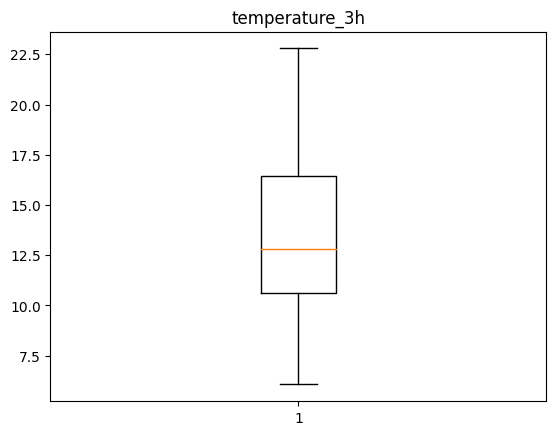

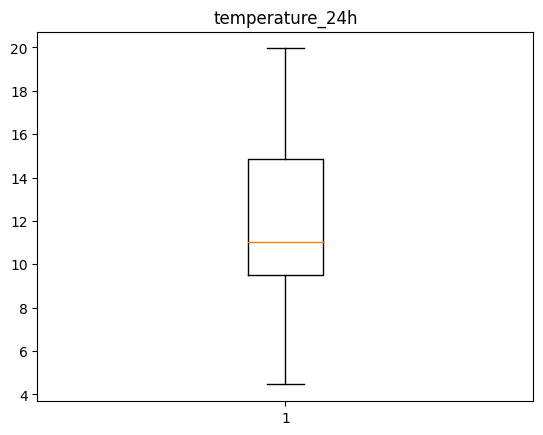

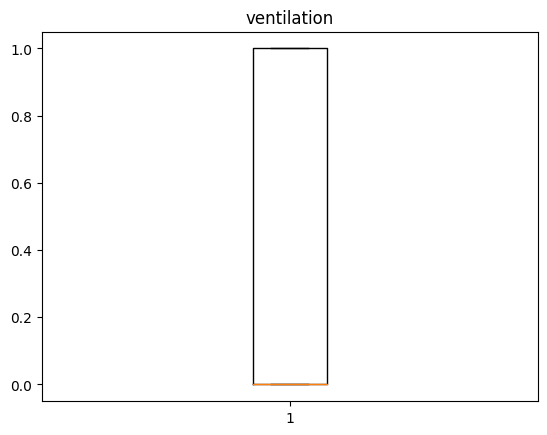

In [ ]:
# Create a box plot for each column
for column in separated_data.columns:
    plt.figure()
    plt.boxplot(separated_data[column])
    plt.title(column)
    plt.show()

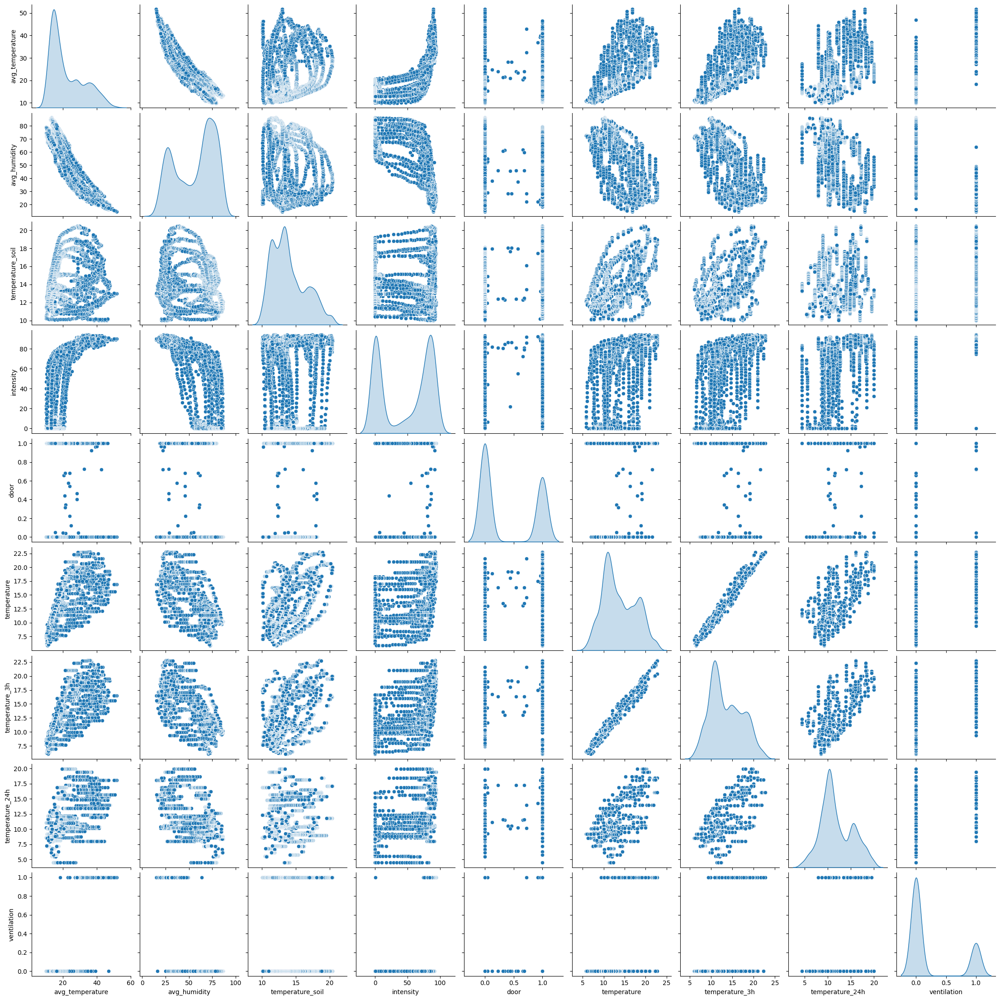

In [ ]:
sns.pairplot(data=separated_data, diag_kind='kde')

# Average Temperature Prediction through Regression

Additional Libraries

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
import sklearn.metrics
from sklearn.preprocessing import StandardScaler

In [ ]:
# choose the features and target variable
#data = separated_data.copy()
#Test = data.tail(432) #36h
#Train = data.drop(data.tail(432).index)

y = separated_data['avg_temperature']
X = separated_data.drop('avg_temperature', axis=1)

y_testing = y.tail(90)
X_testing = X.tail(90)

#scaler = StandardScaler()
#X = scaler.fit_transform(X)
#X_test = scaler.fit_transform(X_test)

# Split
X_trainval, X_test, y_trainval, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_trainval, y_trainval, test_size=0.3, random_state=42)

In [ ]:
# Calculate the proportions of test and validation data
total_samples = len(separated_data)
test_samples = len(X_test)
val_samples = len(X_val)
train_samples = len(X_train)

test_proportion = test_samples / total_samples
val_proportion = val_samples / total_samples
train_proportion = train_samples / total_samples

# Create the bar graph
fig = go.Figure(data=[
    go.Bar(x=['Train Data', 'Test Data', 'Validation Data'], y=[train_proportion, test_proportion, val_proportion])
])

# Customize the layout
fig.update_layout(
    title='Proportion of Data',
    xaxis=dict(title='Data Split'),
    yaxis=dict(title='Proportion'),
)

# Display the graph
fig.show()

### Normalization

In [ ]:
# fit scaler on training data
norm = MinMaxScaler().fit(X_train)

# transform training data
X_train_norm = norm.transform(X_train)

# transform validation data
X_val_norm = norm.transform(X_val)

# transform testing dataabs
X_test_norm = norm.transform(X_test)

Standardization

In [ ]:
# numerical features
num_cols = ['avg_humidity','temperature_soil','intensity','temperature','temperature_3h','temperature_24h', 'door', 'ventilation']
X_train_stand = X_train[num_cols].copy()
X_test_stand = X_test[num_cols].copy()
X_val_stand = X_val[num_cols].copy()

# apply standardization on numerical features
scaler = StandardScaler()

# Standardize X_train
X_train_stand = scaler.fit_transform(X_train)

print(X_train_stand.shape)
# Standardize X_test
X_test_stand = scaler.transform(X_test)

print(X_test_stand.shape)
# Standardize X_val
X_val_stand = scaler.transform(X_val)

print(X_val_stand.shape)

(2069, 8)
(739, 8)
(887, 8)


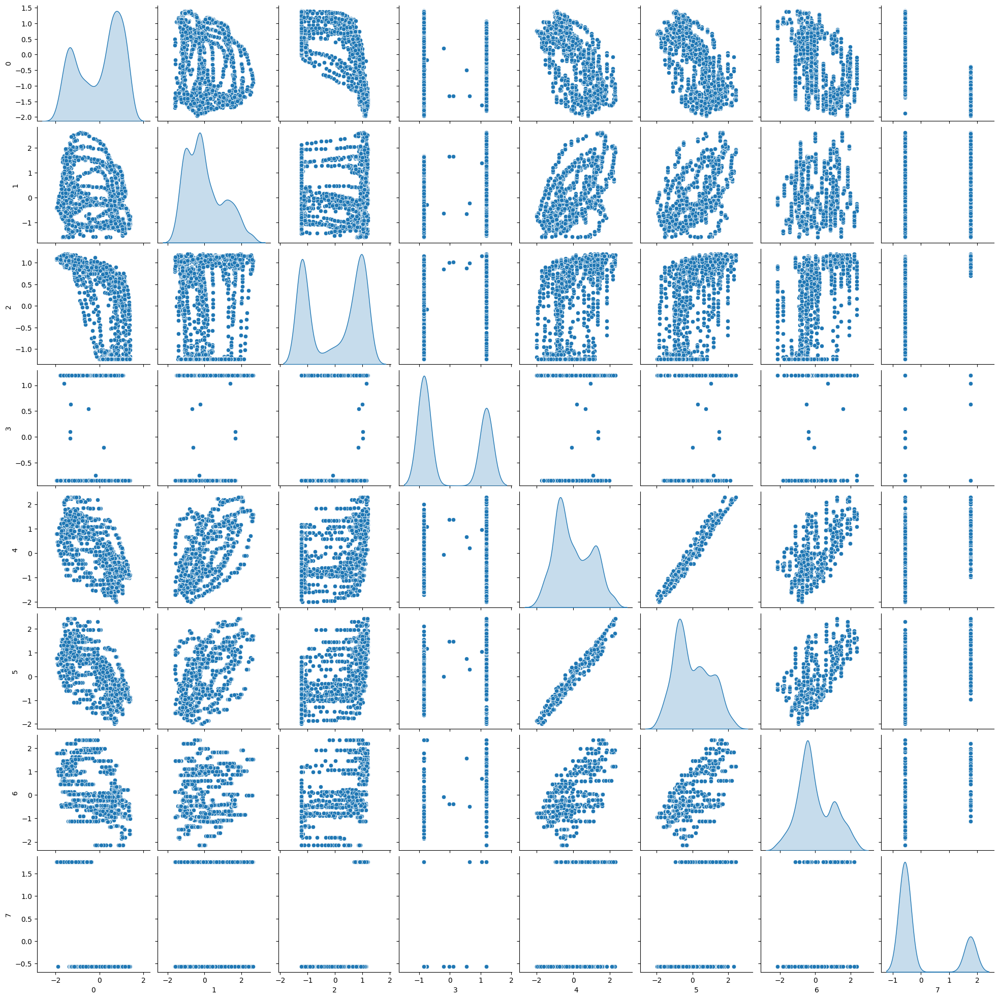

In [ ]:
sns.pairplot(data=pd.DataFrame(X_train_stand), diag_kind='kde')

In [ ]:
from sklearn.svm import SVR

In [ ]:
svr = SVR(C= 6, degree= 2, kernel= 'rbf') 

trainX = [X_train, X_train_norm, X_train_stand]
valX = [X_val, X_val_norm, X_val_stand]
testX = [X_test, X_test_norm, X_test_stand]
r2 = []
mse = []
# model fitting and measuring RMSE
for i in range(len(trainX)):
    
    # fit
    svr.fit(trainX[i],y_train)
    # predict
    pred = svr.predict(testX[i])
    # RMSE
    r2.append(r2_score(y_test,pred))
    mse.append(mean_squared_error(y_test,pred))

# visualizing the result    
df_svr = pd.DataFrame({'R2':r2, 'MSE':mse},index=['Original','Normalized','Standardized'])
df_svr

,R2,MSE
Original,0.957358,4.295217
Normalized,0.978879,2.127442
Standardized,0.982709,1.741668


## Random Forest Regressor

3 min

Best parameters:  {'criterion': 'squared_error', 'max_depth': 25, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 60}
Best score:  0.9881226937011774
MAE: 0.3215
MSE: 0.3484
RMSE: 0.5902
R-squared: 0.9965
Adjusted R-squared: 0.9964
MAE: 0.3605
MSE: 0.5511
RMSE: 0.7424
R-squared: 0.9945
Adjusted R-squared: 0.9945


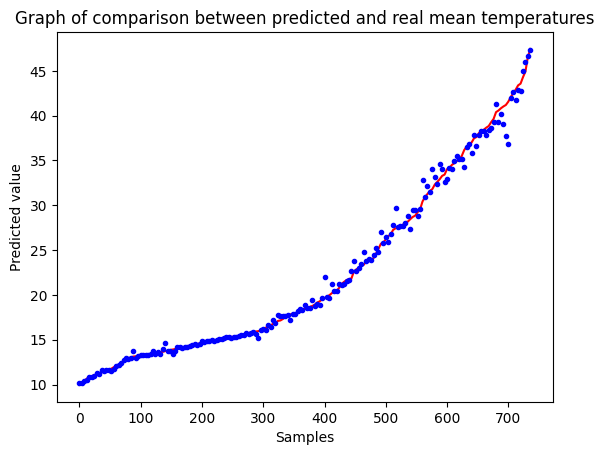

In [ ]:
params = {'n_estimators': list(range(50, 70, 10)),
          'max_depth': [25 ,50],
          'min_samples_leaf': [1, 2, 3],
          'min_samples_split': [2, 3, 4],
          'criterion': ['squared_error', 'absolute_error']}

list_val_rfr, list_test_rfr = regression_model('GridSearchCV',RandomForestRegressor(), params, X_val, y_val, X_train, y_train, X_test, y_test, X_testing, y_testing, 'RFR_r.png')

## Gradient Boosting Regressor 

In [ ]:
from sklearn.ensemble import GradientBoostingRegressor

31 min

Best parameters:  {'criterion': 'squared_error', 'learning_rate': 0.2, 'loss': 'squared_error', 'max_depth': 3, 'min_samples_leaf': 3, 'min_samples_split': 4, 'n_estimators': 100}
Best score:  0.9897423529268847
MAE: 0.5503
MSE: 0.6790
RMSE: 0.8240
R-squared: 0.9931
Adjusted R-squared: 0.9930
MAE: 0.5818
MSE: 0.7702
RMSE: 0.8776
R-squared: 0.9924
Adjusted R-squared: 0.9923


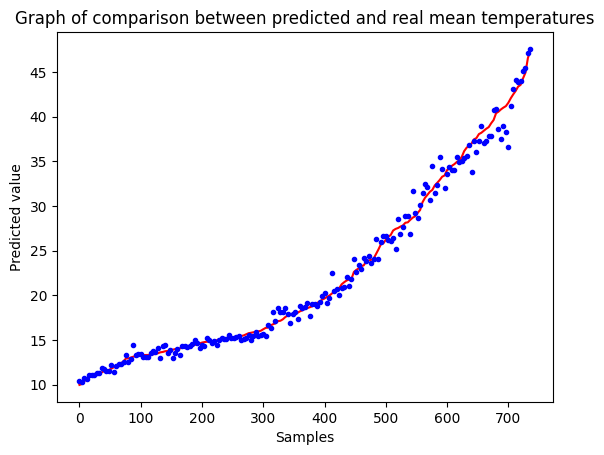

In [ ]:
params = {'n_estimators': list(range(20, 120, 40)),
          'learning_rate': [0.001, 0.1, 0.2],
          'min_samples_leaf': [1, 2, 3, 4],
          'min_samples_split': [2, 3, 4],
          'criterion': ['friedman_mse', 'squared_error'],
          'max_depth': [3, 5, 7],
          'loss': ['squared_error', 'absolute_error']}

list_val_gbr, list_test_gbr = regression_model('GridSearchCV', GradientBoostingRegressor(), params, X_val, y_val, X_train, y_train, X_test, y_test, X_testing, y_testing, 'GBR_r.png')

## KNeighbors Regressor

In [ ]:
from sklearn.neighbors import KNeighborsRegressor

Standardization

In [ ]:
# numerical features
num_cols = ['avg_humidity','temperature_soil','intensity','temperature','temperature_3h','temperature_24h', 'door', 'ventilation']
X_train_stand = X_train[num_cols].copy()
X_test_stand = X_test[num_cols].copy()
X_val_stand = X_val[num_cols].copy()

# apply standardization on numerical features
scaler = StandardScaler()

# Standardize X_train
X_train_stand = scaler.fit_transform(X_train)

print(X_train_stand.shape)
# Standardize X_test
X_test_stand = scaler.transform(X_test)

print(X_test_stand.shape)
# Standardize X_val
X_val_stand = scaler.transform(X_val)

print(X_val_stand.shape)
# Standardize X_testing
X_testing_stand = scaler.transform(X_testing)
print(X_testing_stand.shape)

(2069, 8)
(739, 8)
(887, 8)
(90, 8)


Best parameters:  {'algorithm': 'auto', 'leaf_size': 20, 'n_neighbors': 4, 'weights': 'distance'}
Best score:  0.9785973693606888
MAE: 0.3839
MSE: 0.6091
RMSE: 0.7805
R-squared: 0.9938
Adjusted R-squared: 0.9937
MAE: 0.4143
MSE: 0.6868
RMSE: 0.8287
R-squared: 0.9932
Adjusted R-squared: 0.9931


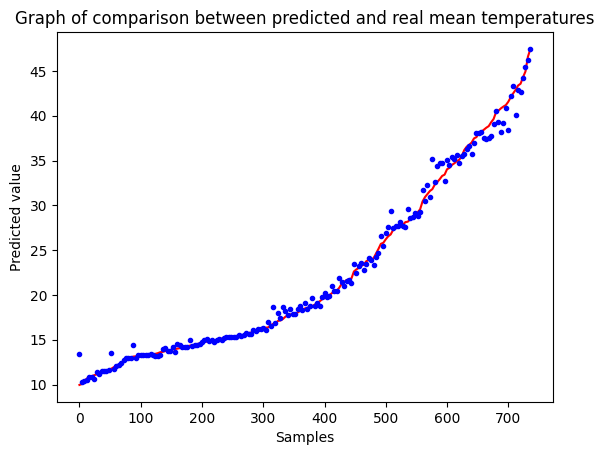

In [ ]:
params = {
    'n_neighbors': list(range(2, 20, 2)),
    'weights': ['uniform', 'distance'],
    'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
    'leaf_size': [20, 50, 100]
}

list_val_knr, list_test_knr = regression_model('GridSearchCV',KNeighborsRegressor(), params, X_val, y_val, X_train, y_train, X_test, y_test, X_testing, y_testing, 'KNN_r.png')

Best parameters:  {'algorithm': 'auto', 'leaf_size': 20, 'n_neighbors': 2, 'weights': 'distance'}
Best score:  0.9813107069272817
MAE: 0.3169
MSE: 0.6185
RMSE: 0.7865
R-squared: 0.9937
Adjusted R-squared: 0.9937
MAE: 0.3311
MSE: 0.5632
RMSE: 0.7505
R-squared: 0.9944
Adjusted R-squared: 0.9943


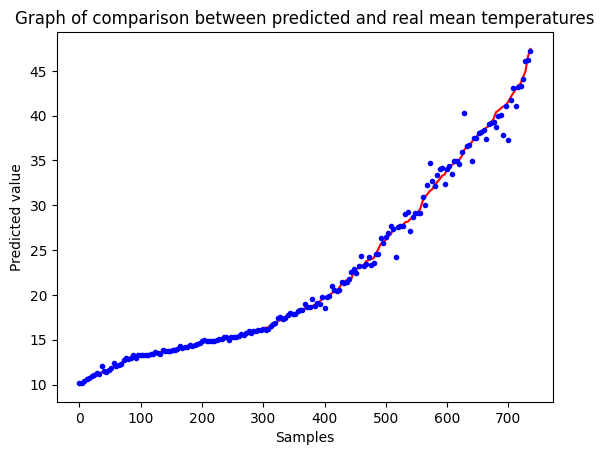

In [ ]:
list_val_knr_stad, list_test_knr_stad = regression_model('GridSearchCV',KNeighborsRegressor(), params, X_val_stand, y_val, X_train_stand, y_train, X_test_stand, y_test, X_testing_stand, y_testing, 'KNN_stad.png')

Best parameters:  {'weights': 'distance', 'n_neighbors': 4, 'leaf_size': 50, 'algorithm': 'kd_tree'}
Best score:  0.9785973693606888
MAE: 0.3839
MSE: 0.6091
RMSE: 0.7805
R-squared: 0.9938
Adjusted R-squared: 0.9937
MAE: 0.4143
MSE: 0.6868
RMSE: 0.8287
R-squared: 0.9932
Adjusted R-squared: 0.9931


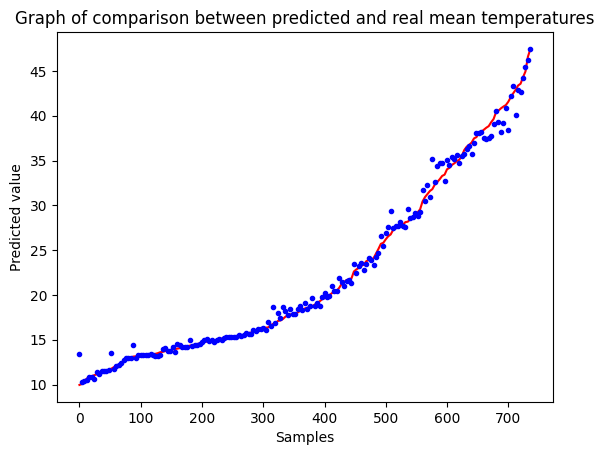

In [ ]:
list_val_knr_RV, list_test_knr_RV = regression_model('RandomizedSearchCV',KNeighborsRegressor(), params, X_val, y_val, X_train, y_train, X_test, y_test , X_testing, y_testing,  'KNN_RS_r.png')

## Support Vector Regression

In [ ]:
from sklearn.svm import SVR

In [ ]:
# numerical features
num_cols = ['avg_humidity','temperature_soil','intensity','temperature','temperature_3h','temperature_24h', 'door', 'ventilation']
X_train_stand = X_train[num_cols].copy()
X_test_stand = X_test[num_cols].copy()
X_val_stand = X_val[num_cols].copy()

# apply standardization on numerical features
scaler = StandardScaler()

# Standardize X_train
X_train_stand = scaler.fit_transform(X_train)

print(X_train_stand.shape)
# Standardize X_test
X_test_stand = scaler.transform(X_test)

print(X_test_stand.shape)
# Standardize X_val
X_val_stand = scaler.transform(X_val)

print(X_val_stand.shape)

# Standardize X_testing
X_testing_stand = scaler.transform(X_testing)
print(X_testing_stand.shape)

(2069, 8)
(739, 8)
(887, 8)
(90, 8)


Best parameters:  {'C': 6, 'degree': 2, 'kernel': 'rbf'}
Best score:  0.9445991617643229
MAE: 1.2568
MSE: 4.4029
RMSE: 2.0983
R-squared: 0.9553
Adjusted R-squared: 0.9548
MAE: 1.2336
MSE: 4.2952
RMSE: 2.0725
R-squared: 0.9574
Adjusted R-squared: 0.9569


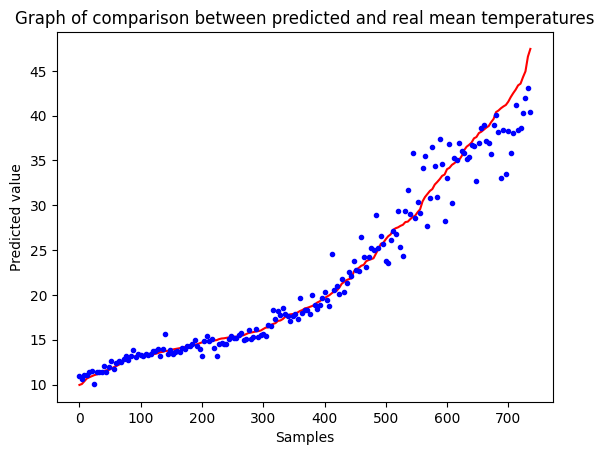

In [ ]:
params = {'degree': list(range(2, 10, 2)),
          'kernel': ['poly', 'linear', 'sigmoid', 'rbf'],
          'C': [1, 4, 6]}

list_val_svr, list_test_svr = regression_model('GridSearchCV', SVR(), params, X_val, y_val, X_train, y_train, X_test, y_test,X_testing, y_testing, 'SVR_r.png')

Best parameters:  {'C': 6, 'degree': 2, 'kernel': 'rbf'}
Best score:  0.9718884532514712
MAE: 0.7356
MSE: 2.0407
RMSE: 1.4285
R-squared: 0.9793
Adjusted R-squared: 0.9791
MAE: 0.6958
MSE: 1.7417
RMSE: 1.3197
R-squared: 0.9827
Adjusted R-squared: 0.9825


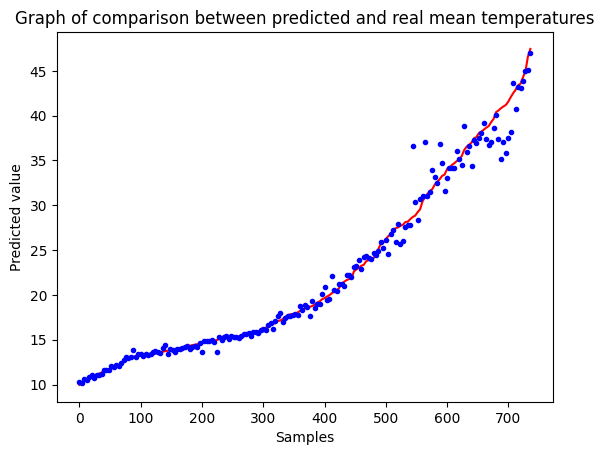

In [ ]:
params = {'degree': list(range(2, 10, 2)),
          'kernel': ['poly', 'linear', 'sigmoid', 'rbf'],
          'C': [1, 4, 6]}
          
list_val_knr_stad, list_test_knr_stad = regression_model('GridSearchCV',SVR(), params, X_val_stand, y_val, X_train_stand, y_train, X_test_stand, y_test, X_testing_stand, y_testing, 'SNR_stad.png')

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_search.py:305: UserWarning:

The total space of parameters 48 is smaller than n_iter=100. Running 48 iterations. For exhaustive searches, use GridSearchCV.



Best parameters:  {'kernel': 'rbf', 'degree': 2, 'C': 6}
Best score:  0.9445991617643229
MAE: 1.2568
MSE: 4.4029
RMSE: 2.0983
R-squared: 0.9553
Adjusted R-squared: 0.9548
MAE: 1.2336
MSE: 4.2952
RMSE: 2.0725
R-squared: 0.9574
Adjusted R-squared: 0.9569


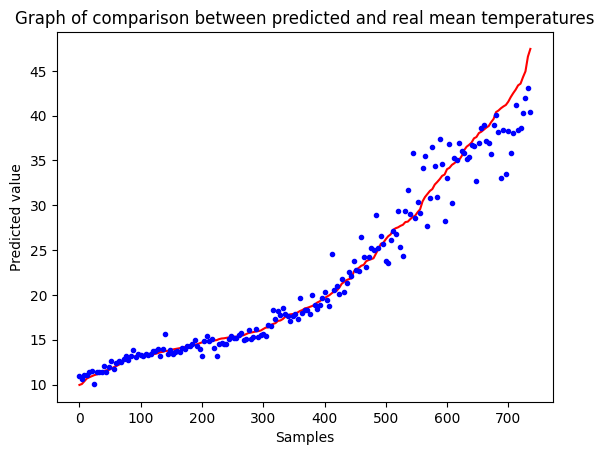

In [ ]:
list_val_svr_RV, list_test_svr_RV = regression_model('RandomizedSearchCV', SVR (), params, X_val, y_val, X_train, y_train, X_test, y_test,X_testing, y_testing, 'SVR_r.png')

### Results

In [ ]:
# Create a dictionary with the lists
data = {
    'Random Forest Regressor': list_test_rfr,
    'Gradient Boosting Regressor': list_test_gbr,
    'KNeighbors Regressor': list_test_knr,
    'Support Vector Regression': list_test_svr
}

# Create the DataFrame
regr_results = pd.DataFrame(data, index=['MAE', 'MSE', 'RMSE', 'R2', 'Adjusted R2'])
regr_results

In [ ]:
from tabulate import tabulate

# Assuming 'data' is a dictionary containing the regression results

# Format the values in the dictionary to two decimal places
formatted_data = {key: [f"{value:.2f}" for value in values] for key, values in regr_results.items()}

# Convert the formatted dictionary to a LaTeX table
latex_table = tabulate(formatted_data, headers='keys', tablefmt='latex')

# Print the LaTeX table
print(latex_table)

# Control of Ventilation through Classification

In [ ]:
# choose the features and target variable
data = separated_data.copy()
y = data['ventilation']
X = data.drop('ventilation', axis=1)

#scaler = StandardScaler()
#X = scaler.fit_transform(X)
#X_test = scaler.fit_transform(X_test)

# Split
X_trainval, X_test, y_trainval, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_trainval, y_trainval, test_size=0.3, random_state=42)

## Decision Tree Classifier

In [ ]:
param_grid = {
    'criterion': ['gini','entropy', 'log_loss'],
    'max_depth': [None, 5, 10, 15],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': [None, 'sqrt', 'log2']
}

val_dtc, test_dtc = classification_model('GridSearchCV',DecisionTreeClassifier(), 
                                         param_grid, X_val, y_val, X_train, y_train, X_test, y_test)

Best parameters:  {'criterion': 'log_loss', 'max_depth': 10, 'max_features': None, 'min_samples_leaf': 2, 'min_samples_split': 10}
Best score:  0.8583315043237788
Accuracy: 0.9785794813979707
Precision: 0.9644444444444444
Recall: 0.9517543859649122
F1 Score: 0.9580573951434879
ROC AUC Score: 0.9698073902510449
Accuracy: 0.9824086603518268
Precision: 0.9787234042553191
Recall: 0.9533678756476683
F1 Score: 0.9658792650918635
ROC AUC Score: 0.9730209341608305


## RandomForestClassifier

In [ ]:
from sklearn.ensemble import RandomForestClassifier

18 min

In [ ]:
param_grid = {
    'n_estimators' : list(range(100, 200, 50)),
    'criterion': ['gini','entropy', 'log_loss'],
    'max_depth': [None, 5, 10],
    'min_samples_split': [2, 3],
    'min_samples_leaf': [1, 2, 4],
    'max_features': [None, 'sqrt', 'log2']
}

val_rfc, test_rfc = classification_model('GridSearchCV',RandomForestClassifier(), 
                                         param_grid, X_val, y_val, X_train, y_train, X_test, y_test)

Best parameters:  {'criterion': 'log_loss', 'max_depth': 5, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 3, 'n_estimators': 150}
Best score:  0.8878370864609396
Accuracy: 0.9785794813979707
Precision: 0.9523809523809523
Recall: 0.9649122807017544
F1 Score: 0.9586056644880173
ROC AUC Score: 0.9741101615951867
Accuracy: 0.9891745602165088
Precision: 0.9894179894179894
Recall: 0.9689119170984456
F1 Score: 0.9790575916230366
ROC AUC Score: 0.9826244567177209


## KNeighbors Classifier

In [ ]:
from sklearn.neighbors import KNeighborsClassifier

16 min

In [ ]:
param_grid = {
    'n_neighbors' : list(range(2, 10, 2)),
    'weights': ['uniform','distance'],
    'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
    'leaf_size': [20, 30, 40],
}

val_knc, test_knc = classification_model('GridSearchCV',KNeighborsClassifier(), 
                                         param_grid, X_val_stand, y_val, X_train_stand, y_train, X_test_stand, y_test)

Best parameters:  {'algorithm': 'auto', 'leaf_size': 20, 'n_neighbors': 8, 'weights': 'uniform'}
Best score:  0.7992647381589921
Accuracy: 0.9526493799323562
Precision: 0.9043478260869565
Recall: 0.9122807017543859
F1 Score: 0.9082969432314411
ROC AUC Score: 0.9394483933658121
Accuracy: 0.9756427604871448
Precision: 0.9533678756476683
Recall: 0.9533678756476683
F1 Score: 0.9533678756476683
ROC AUC Score: 0.9684421795820758


## Support Vector Classification

In [ ]:
from sklearn.svm import SVC

8 min

In [ ]:
param_grid = {
    'C' : list(range(2, 6, 1)),
    'kernel': ['linear','poly', 'rbf', 'sigmoid'],
    'degree': list(range(2, 6, 2)),
    'gamma': ['scale', 'auto']
}

val_svc, test_svc = classification_model('GridSearchCV',SVC(), 
                                         param_grid, X_val_stand, y_val, X_train_stand, y_train, X_test_stand, y_test)

Best parameters:  {'C': 4, 'degree': 2, 'gamma': 'scale', 'kernel': 'linear'}
Best score:  0.8582898029059304
Accuracy: 0.9751972942502819
Precision: 0.9478260869565217
Recall: 0.956140350877193
F1 Score: 0.9519650655021834
ROC AUC Score: 0.9689654713414797
Accuracy: 0.9837618403247632
Precision: 0.983957219251337
Recall: 0.9533678756476683
F1 Score: 0.968421052631579
ROC AUC Score: 0.9739366850765814


Normalization

In [ ]:
# fit scaler on training data
norm = MinMaxScaler().fit(X_train)

# transform training data
X_train_norm = norm.transform(X_train)

# transform validation data
X_val_norm = norm.transform(X_val)

# transform testing dataabs
X_test_norm = norm.transform(X_test)

Standardization

In [ ]:
# numerical features
num_cols = ['avg_temperature','avg_humidity','temperature_soil','intensity','temperature','temperature_3h','temperature_24h', 'door']
X_train_stand = X_train[num_cols].copy()
X_test_stand = X_test[num_cols].copy()
X_val_stand = X_val[num_cols].copy()

# apply standardization on numerical features
scaler = StandardScaler()

# Standardize X_train
X_train_stand = scaler.fit_transform(X_train)

print(X_train_stand.shape)
# Standardize X_test
X_test_stand = scaler.transform(X_test)

print(X_test_stand.shape)
# Standardize X_val
X_val_stand = scaler.transform(X_val)

print(X_val_stand.shape)

(2069, 8)
(739, 8)
(887, 8)


In [ ]:
svr = SVC(C= 6, degree= 2, kernel= 'rbf') 

trainX = [X_train, X_train_norm, X_train_stand]
valX = [X_val, X_val_norm, X_val_stand]
testX = [X_test, X_test_norm, X_test_stand]
f1 = []
accuracy = []
# model fitting and measuring RMSE
for i in range(len(trainX)):
    
    # fit
    svr.fit(trainX[i],y_train)
    # predict
    pred = svr.predict(testX[i])
    # RMSE
    accuracy.append(accuracy_score(y_test,pred))
    f1.append(f1_score(y_test,pred))

# visualizing the result    
df_svr = pd.DataFrame({'Accuracy':accuracy, 'F1':f1},index=['Original','Normalized','Standardized'])
df_svr

,Accuracy,F1
Original,0.982409,0.965699
Normalized,0.978349,0.958333
Standardized,0.982409,0.966408


## Table

In [ ]:
# Create a dictionary with the lists
data = {
    'Decision Tree Classifier': test_dtc,
    'RandomForestClassifier': test_knc,
    'KNeighbors Classifier': test_rfc,
    'Support Vector Classification': test_svc
}

# Create the DataFrame
class_results = pd.DataFrame(data, index=['Accuracy', 'Precision', 'Recall', 'F1', 'ROC curve'])
class_results